# Import Library

In [1]:
# tensorflow libraries
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.layers import Activation, Add, BatchNormalization, Conv2D, Flatten, Dense, DepthwiseConv2D, Dropout, GlobalAveragePooling2D, Input, Layer, MaxPool2D, MaxPooling2D, Multiply, ReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import categorical_crossentropy
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import load_model
from tensorflow.keras.callbacks import Callback, EarlyStopping,ModelCheckpoint, ReduceLROnPlateau

# system libraries
import os
import random
from pathlib import Path

# visualization libraries
import matplotlib.cm as cm
import matplotlib.pyplot as plt
import cv2
import seaborn as sns

import pandas as pd
import numpy as np

from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, make_scorer
from sklearn.model_selection import train_test_split

In [2]:
# Define constants
DATASET_PATH = "C:\\Users\\User\\Downloads\\FYP-test\\ds\\"
BATCH_SIZE = 32
EPOCHS = 20
TARGET_SIZE = (224, 224)

# Helper function

In [3]:
def walk_through_dir(dir_path):
  for dirpath, dirnames, filenames in os.walk(dir_path):
    print(f"There are {len(dirnames)} directories and {len(filenames)} images in '{dirpath}'.")

In [4]:
def load_dataset(file):
    data = []
    class_labels = []
    for label, class_folder in enumerate(os.listdir(file)):
        class_labels.append(class_folder)
        class_path = os.path.join(file, class_folder)
        if os.path.isdir(class_path):
            for image_file in os.listdir(class_path):
                image_path = os.path.join(class_path, image_file)
                # Append (file_path, label) tuple to data list
                data.append((image_path, label))
    return data, class_labels

In [5]:
# Walk through each directory for apple types
walk_through_dir(DATASET_PATH);

There are 5 directories and 0 images in 'C:\Users\User\Downloads\FYP-test\ds\'.
There are 0 directories and 390 images in 'C:\Users\User\Downloads\FYP-test\ds\Cripps Red'.
There are 0 directories and 463 images in 'C:\Users\User\Downloads\FYP-test\ds\Fuji'.
There are 0 directories and 446 images in 'C:\Users\User\Downloads\FYP-test\ds\Granny Smith'.
There are 0 directories and 441 images in 'C:\Users\User\Downloads\FYP-test\ds\Not Apple'.
There are 0 directories and 441 images in 'C:\Users\User\Downloads\FYP-test\ds\Red Delicious'.


In [6]:
image, labels = load_dataset(DATASET_PATH)
print(image)
print(labels)

[('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (1).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (10).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (100).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (101).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (102).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (103).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (104).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (105).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (106).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (107).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (108).jpg', 0), ('C:\\Users\\User\\Downloads\\FYP-test\\ds\\Cripps Red\\cripps-red (109).jpg', 0), ('C:\\

# Data Visualization

In [7]:
image_dir = Path(DATASET_PATH)

# Get filepaths and labels
filepaths = list(image_dir.glob(r'**/*.jpg'))

type_labels = list(map(lambda x: os.path.split(os.path.split(x)[0])[1], filepaths))

filepaths = pd.Series(filepaths, name='Filepath').astype(str)

type_labels = pd.Series(type_labels, name='Label')

# Concatenate filepaths and labels
image_df = pd.concat([filepaths, type_labels], axis=1)

print(type_labels)

0          Cripps Red
1          Cripps Red
2          Cripps Red
3          Cripps Red
4          Cripps Red
            ...      
2176    Red Delicious
2177    Red Delicious
2178    Red Delicious
2179    Red Delicious
2180    Red Delicious
Name: Label, Length: 2181, dtype: object


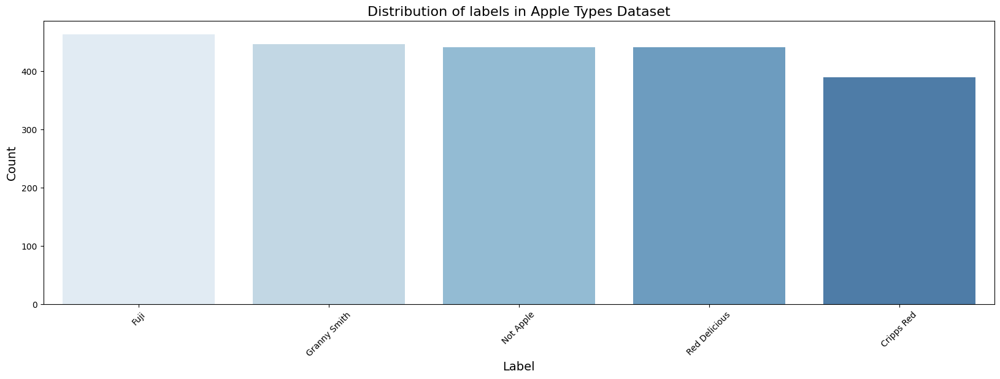

In [8]:
label_counts = image_df['Label'].value_counts()[:20]

plt.figure(figsize=(20, 6))
sns.barplot(x=label_counts.index, y=label_counts.values, alpha=0.8, palette='Blues')
plt.title('Distribution of labels in Apple Types Dataset', fontsize=16)
plt.xlabel('Label', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.xticks(rotation=45)
plt.show()


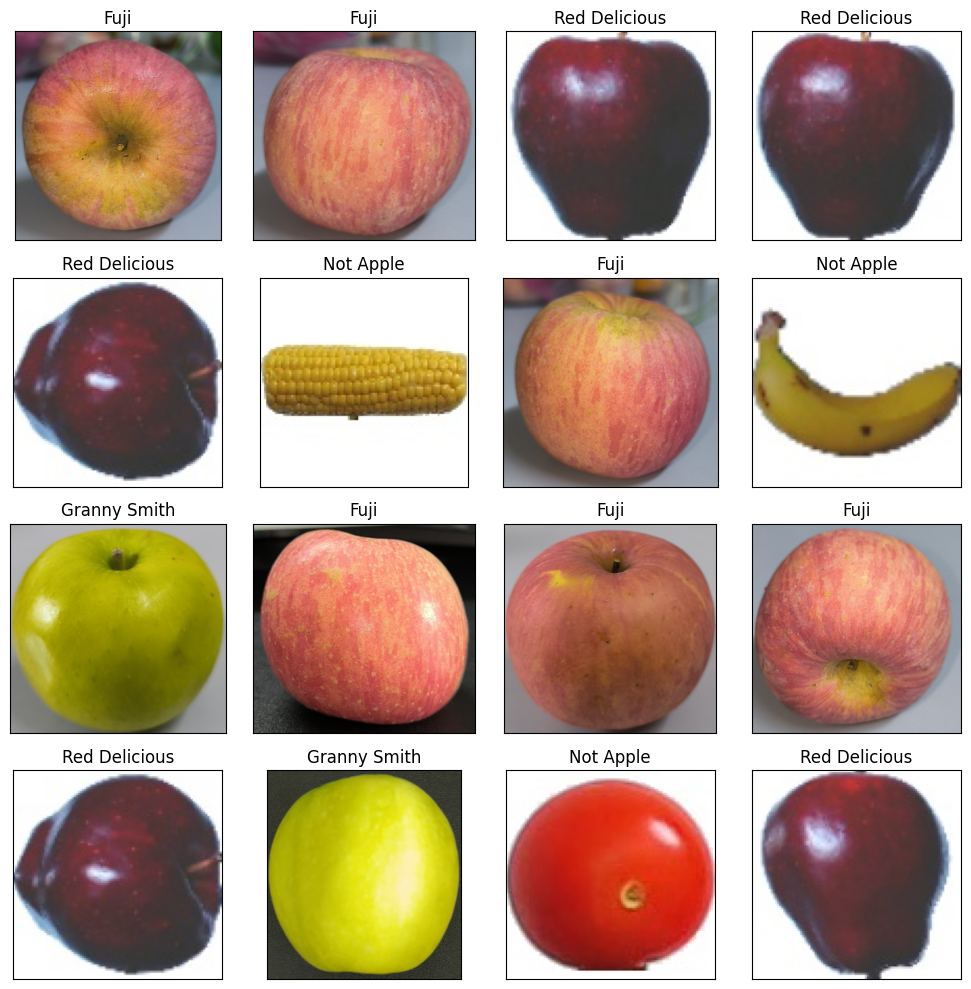

In [9]:
random_index = np.random.randint(0, len(image_df), 16)
fig, axes = plt.subplots(nrows=4, ncols=4, figsize=(10, 10),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(image_df.Filepath[random_index[i]]))
    ax.set_title(image_df.Label[random_index[i]])
plt.tight_layout()
plt.show()

# Data Preprocessing

In [10]:
# Separate in train and test data
train_df, test_df = train_test_split(image_df, test_size=0.2, shuffle=True, random_state=42)

In [11]:
# Set up data generators for training, validation, and testing
train_datagen = ImageDataGenerator(
    rescale=1./255,             # Rescale pixel values to [0, 1]
    validation_split=0.2,       # Split 20% of the data for validation
    rotation_range=20,          # Randomly rotate images by up to 20 degrees
    width_shift_range=0.1,      # Randomly shift images horizontally by up to 10%
    height_shift_range=0.1,     # Randomly shift images vertically by up to 10%
    shear_range=0.1,            # Apply shear transformation with intensity up to 10%
    zoom_range=0.1,             # Randomly zoom into images by up to 10%
    horizontal_flip=True,       # Randomly flip images horizontally
    fill_mode='nearest'         # Strategy for filling in newly created pixels after rotation or shifting
)

# Create a generator for training data
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',  # Column containing the file paths
    y_col='Label',  # Column containing the labels
    target_size=TARGET_SIZE,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,  # Shuffle the data
    seed = 42,
    subset='training'
)

# Create a generator for validation data
validation_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='Filepath',  # Column containing the file paths
    y_col='Label',  # Column containing the labels
    target_size=TARGET_SIZE,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,  # Shuffle the data
    seed = 42,
    subset='validation'
)

# Create a generator for testing data (if needed)
test_generator = train_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='Filepath',  # Column containing the file paths
    y_col='Label',  # Column containing the labels
    target_size=TARGET_SIZE,
    color_mode='rgb',
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle= False
)

# Display the class indices
print("Class Indices:", train_generator.class_indices)

# Display the number of samples in each split
print("Number of training samples:", train_generator.samples)
print("Number of validation samples:", validation_generator.samples)
print("Number of testing samples:", test_generator.samples)

Found 1396 validated image filenames belonging to 5 classes.
Found 348 validated image filenames belonging to 5 classes.
Found 437 validated image filenames belonging to 5 classes.
Class Indices: {'Cripps Red': 0, 'Fuji': 1, 'Granny Smith': 2, 'Not Apple': 3, 'Red Delicious': 4}
Number of training samples: 1396
Number of validation samples: 348
Number of testing samples: 437


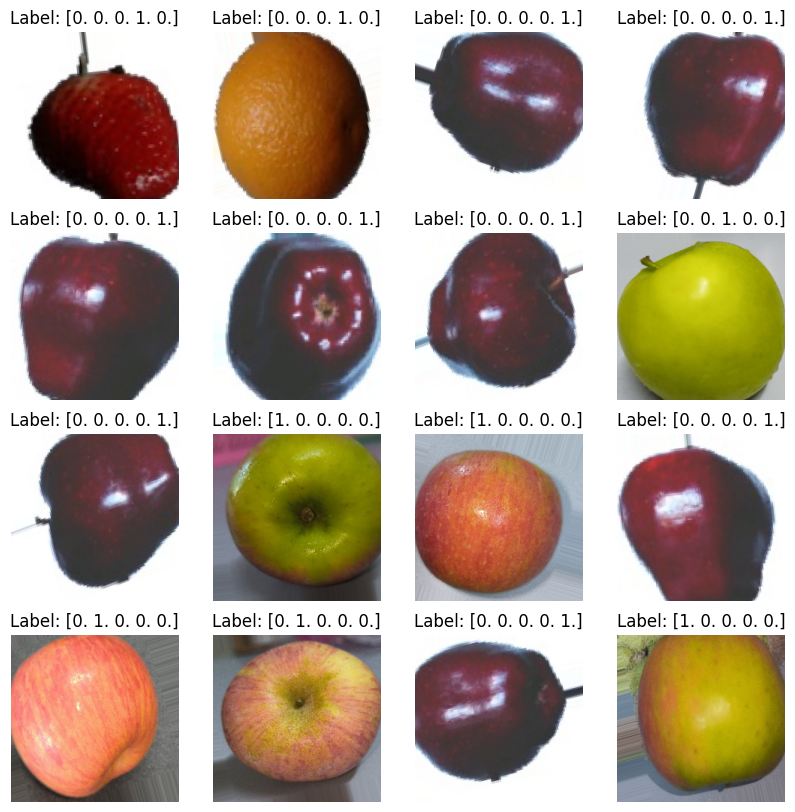

In [12]:
# Fetch a batch of images and labels from the data generator
x_batch, y_batch = next(train_generator)

# Visualize the first few images and their labels
plt.figure(figsize=(10, 10))
for i in range(min(16, len(x_batch))):  # Visualize up to 16 images
    plt.subplot(4, 4, i + 1)
    plt.imshow(x_batch[i])
    plt.title('Label: ' + str(y_batch[i]))
    plt.axis('off')
plt.show()

In [13]:
print(y_batch)

[[0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [1. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1.]
 [1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 0. 1. 0.]
 [0. 0. 1. 0. 0.]
 [0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 1.]]


# Define Model

## Model 1: custom CNN

In [64]:
# Define the CNN model
model = Sequential([
    Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D(pool_size=(2, 2)),
    Flatten(),
    Dense(256, activation='relu'),
    Dropout(0.5),  # Add dropout for regularization
    Dense(128, activation='relu'),
    Dropout(0.5),  # Add another dropout layer
    Dense(len(train_generator.class_indices), activation='softmax')  # Output layer with softmax activation for multi-class classification
])

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_3 (Conv2D)           (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 111, 111, 32)      0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 54, 54, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 52, 52, 128)       73856     
                                                                 
 max_pooling2d_5 (MaxPoolin  (None, 26, 26, 128)      

## Model 2: MobileNet V2

In [72]:
base_model = MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights=None)

# Freeze the base model
base_model.trainable = False

model2 = tf.keras.Sequential([
    base_model,
    tf.keras.layers.GlobalAveragePooling2D(),
    # tf.keras.layers.Dense(768, activation='relu'),
    # tf.keras.layers.Dense(768, activation='relu'),
    tf.keras.layers.Dense(5, activation='softmax')  # Adjust the number of units to match the number of classes
])

model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

model2.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d_1  (None, 1280)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_7 (Dense)             (None, 5)                 6405      
                                                                 
Total params: 2264389 (8.64 MB)
Trainable params: 6405 (25.02 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


## Model 3: Pre-trained MobileNetV2

In [14]:
# Define the MobileNetV2 model with pre-trained weights from ImageNet
pretrained_mobilenetv2 = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Freeze the weights of the pre-trained layers
pretrained_mobilenetv2.trainable = False

# Add a custom classification head on top of the pre-trained model
model3 = tf.keras.models.Sequential([
    pretrained_mobilenetv2,
    tf.keras.layers.GlobalAveragePooling2D(),
    # tf.keras.layers.Dense(768, activation='relu'),
    # tf.keras.layers.Dense(768, activation='relu'),
    tf.keras.layers.Dense(5, activation='softmax')  # Adjusted number of units
])

# Compile the model
model3.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Display the model summary
model3.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Func  (None, 7, 7, 1280)        2257984   
 tional)                                                         
                                                                 
 global_average_pooling2d (  (None, 1280)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense (Dense)               (None, 5)                 6405      
                                                                 
Total params: 2264389 (8.64 MB)
Trainable params: 6405 (25.02 KB)
Non-trainable params: 2257984 (8.61 MB)
_________________________________________________________________


# Model Training

## Model 1: Custom CNN

In [65]:
# Define callbacks
callbacks = [
    EarlyStopping(patience=5, monitor='val_loss', verbose=1),
    ModelCheckpoint('custom_CNN_type1.h5', save_best_only=True, monitor='val_loss', mode='min'),
    # ReduceLROnPlateau(factor=0.1, patience=2, min_lr=0.00001, verbose=1),
]

# Train the model
history = model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE,
    callbacks=callbacks
)


Epoch 1/20
43/43 [==============================] - ETA: 0s - loss: 1.1624 - accuracy: 0.5447

C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


43/43 [==============================] - 40s 913ms/step - loss: 1.1624 - accuracy: 0.5447 - val_loss: 0.4878 - val_accuracy: 0.8469
Epoch 2/20
43/43 [==============================] - 39s 900ms/step - loss: 0.4246 - accuracy: 0.8358 - val_loss: 0.1572 - val_accuracy: 0.9531
Epoch 3/20
43/43 [==============================] - 39s 910ms/step - loss: 0.2670 - accuracy: 0.9084 - val_loss: 0.1441 - val_accuracy: 0.9469
Epoch 4/20
43/43 [==============================] - 40s 925ms/step - loss: 0.1794 - accuracy: 0.9487 - val_loss: 0.0500 - val_accuracy: 0.9844
Epoch 5/20
43/43 [==============================] - 40s 937ms/step - loss: 0.1895 - accuracy: 0.9384 - val_loss: 0.0732 - val_accuracy: 0.9844
Epoch 6/20
43/43 [==============================] - 38s 891ms/step - loss: 0.2025 - accuracy: 0.9296 - val_loss: 0.0928 - val_accuracy: 0.9656
Epoch 7/20
43/43 [==============================] - 39s 910ms/step - loss: 0.1404 - accuracy: 0.9523 - val_loss: 0.0667 - val_accuracy: 0.9781
Epoch 8/20

## Model 2: MobileNet V2

In [73]:
# Define callbacks
callbacks = [
    EarlyStopping(patience=5, monitor='val_loss', verbose=1),
    ModelCheckpoint('MobileNetv2_type2.h5', save_best_only=True, monitor='val_loss', mode='min')
    # ReduceLROnPlateau(factor=0.1, patience=2, min_lr=0.00001, verbose=1),
]

# Train the model
history = model2.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE,
    callbacks=callbacks
)

Epoch 1/20
43/43 [==============================] - 27s 591ms/step - loss: 1.6095 - accuracy: 0.2067 - val_loss: 1.6091 - val_accuracy: 0.2062
Epoch 2/20


C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


43/43 [==============================] - 24s 564ms/step - loss: 1.6089 - accuracy: 0.2031 - val_loss: 1.6085 - val_accuracy: 0.1969
Epoch 3/20
43/43 [==============================] - 25s 572ms/step - loss: 1.6086 - accuracy: 0.1957 - val_loss: 1.6088 - val_accuracy: 0.1969
Epoch 4/20
43/43 [==============================] - 24s 563ms/step - loss: 1.6082 - accuracy: 0.2163 - val_loss: 1.6082 - val_accuracy: 0.1906
Epoch 5/20
43/43 [==============================] - 24s 562ms/step - loss: 1.6082 - accuracy: 0.2163 - val_loss: 1.6090 - val_accuracy: 0.1813
Epoch 6/20
43/43 [==============================] - 25s 570ms/step - loss: 1.6080 - accuracy: 0.2122 - val_loss: 1.6078 - val_accuracy: 0.2000
Epoch 7/20
43/43 [==============================] - 24s 564ms/step - loss: 1.6080 - accuracy: 0.2104 - val_loss: 1.6086 - val_accuracy: 0.1937
Epoch 8/20
43/43 [==============================] - 24s 565ms/step - loss: 1.6076 - accuracy: 0.2155 - val_loss: 1.6087 - val_accuracy: 0.1906
Epoch 9/20

## Model 3: Pre-trained MobileNet V2

In [16]:
# Define callbacks
callbacks = [
    EarlyStopping(patience=5, monitor='val_loss', verbose=1),
    ModelCheckpoint('MobileNetv2_type3.h5', save_best_only=True, monitor='val_loss', mode='min')
    # ReduceLROnPlateau(factor=0.1, patience=2, min_lr=0.00001, verbose=1),
]

# Train the model
history = model3.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // BATCH_SIZE,
    epochs=EPOCHS,
    validation_data=validation_generator,
    validation_steps=validation_generator.samples // BATCH_SIZE,
    callbacks=callbacks
)

Epoch 1/20
43/43 [==============================] - 27s 597ms/step - loss: 0.6253 - accuracy: 0.7940 - val_loss: 0.1949 - val_accuracy: 0.9656
Epoch 2/20


C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\keras\src\engine\training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


43/43 [==============================] - 25s 589ms/step - loss: 0.1366 - accuracy: 0.9795 - val_loss: 0.1123 - val_accuracy: 0.9844
Epoch 3/20
43/43 [==============================] - 25s 579ms/step - loss: 0.0879 - accuracy: 0.9868 - val_loss: 0.0758 - val_accuracy: 0.9875
Epoch 4/20
43/43 [==============================] - 25s 576ms/step - loss: 0.0677 - accuracy: 0.9905 - val_loss: 0.0563 - val_accuracy: 0.9969
Epoch 5/20
43/43 [==============================] - 25s 576ms/step - loss: 0.0517 - accuracy: 0.9927 - val_loss: 0.0599 - val_accuracy: 0.9875
Epoch 6/20
43/43 [==============================] - 25s 577ms/step - loss: 0.0456 - accuracy: 0.9897 - val_loss: 0.0464 - val_accuracy: 0.9844
Epoch 7/20
43/43 [==============================] - 25s 576ms/step - loss: 0.0373 - accuracy: 0.9949 - val_loss: 0.0587 - val_accuracy: 0.9844
Epoch 8/20
43/43 [==============================] - 25s 579ms/step - loss: 0.0311 - accuracy: 0.9971 - val_loss: 0.0331 - val_accuracy: 0.9969
Epoch 9/20

# Model Evaluation

## Model 1: Custom CNN

In [66]:
# Evaluate the trained model on the test set (run this when already done training)
model1 = load_model('custom_CNN_type1.h5')
test_loss, test_accuracy = model1.evaluate(test_generator)



# # # Evaluate the model on the test set
# # test_loss, test_accuracy = model2.evaluate(test_generator)

# Print the test loss and accuracy
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

14/14 [==============================] - 6s 386ms/step - loss: 0.0291 - accuracy: 0.9931
Test Loss: 0.029083631932735443
Test Accuracy: 0.9931350350379944


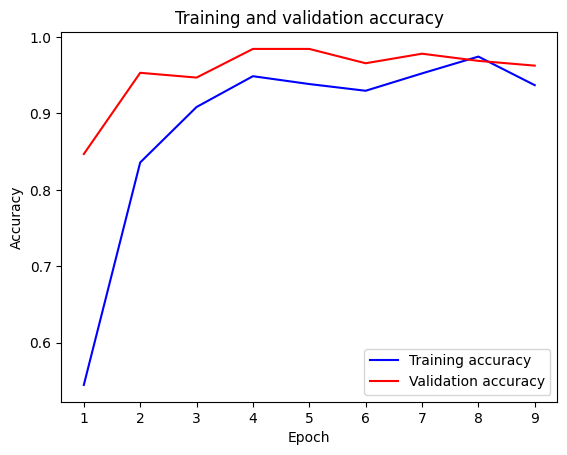

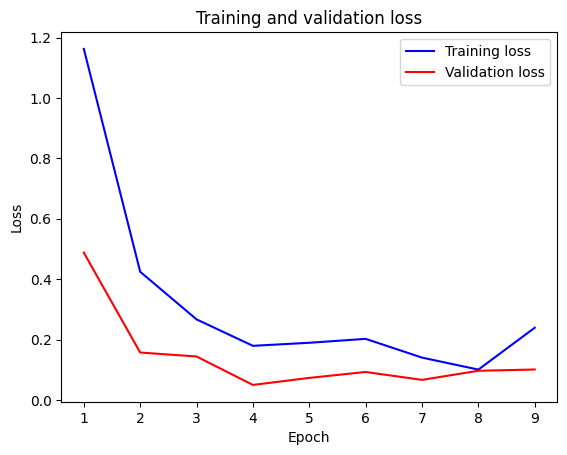

In [67]:
##### import matplotlib.pyplot as plt

# Extracting training and validation accuracy and loss
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']


loss = history.history['loss']
val_loss = history.history['val_loss']


# Calculating the number of epochs
epochs = range(1, len(accuracy) + 1)

# Plotting accuracy
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plotting loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()


## Model 2: MobileNet V2

In [76]:
# Evaluate the trained model on the test set (run this when already done training)
model2 = load_model('MobileNetv2_type2.h5')
test_loss, test_accuracy = model2.evaluate(test_generator)

# # Evaluate the model on the test set
# test_loss, test_accuracy = model2_1.evaluate(test_generator)

# Print the test loss and accuracy
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

14/14 [==============================] - 7s 481ms/step - loss: 1.6094 - accuracy: 0.1739
Test Loss: 1.6094287633895874
Test Accuracy: 0.17391304671764374


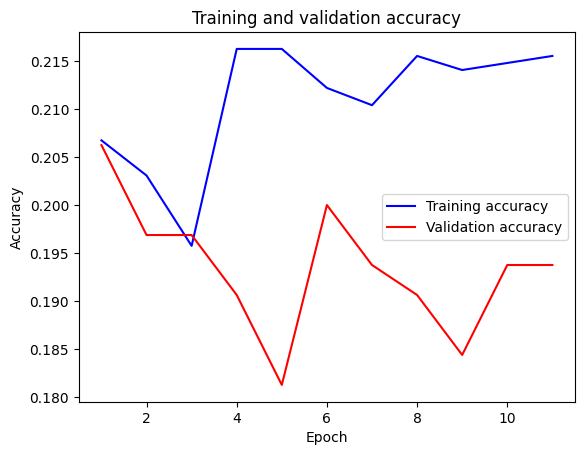

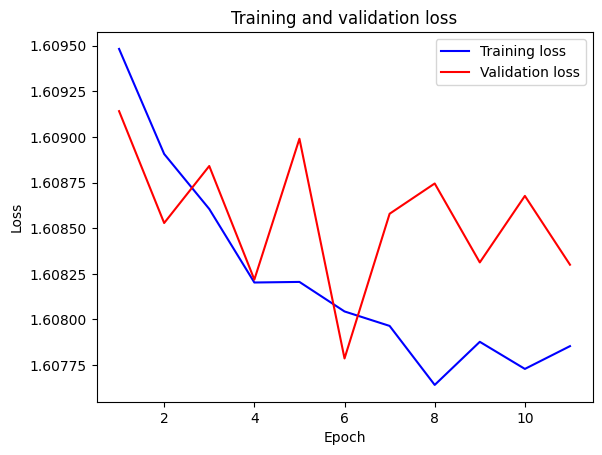

In [75]:
# Extracting training and validation accuracy and loss (model2_1)
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']


loss = history.history['loss']
val_loss = history.history['val_loss']


# Calculating the number of epochs
epochs = range(1, len(accuracy) + 1)

# Plotting accuracy
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plotting loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

## Model 3: Pre-trained MobileNetV2

In [15]:
# Evaluate the trained model on the test set (run this when already done training)
model3 = load_model('MobileNetv2_type3.h5')
test_loss, test_accuracy = model3.evaluate(test_generator)

# # Evaluate the model on the test set
# test_loss, test_accuracy = model2_2.evaluate(test_generator)

# Print the test loss and accuracy
print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

14/14 [==============================] - 8s 481ms/step - loss: 0.0258 - accuracy: 0.9977
Test Loss: 0.025794029235839844
Test Accuracy: 0.9977116584777832


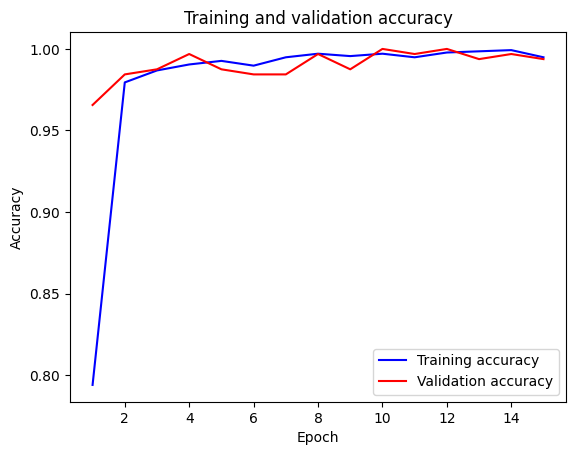

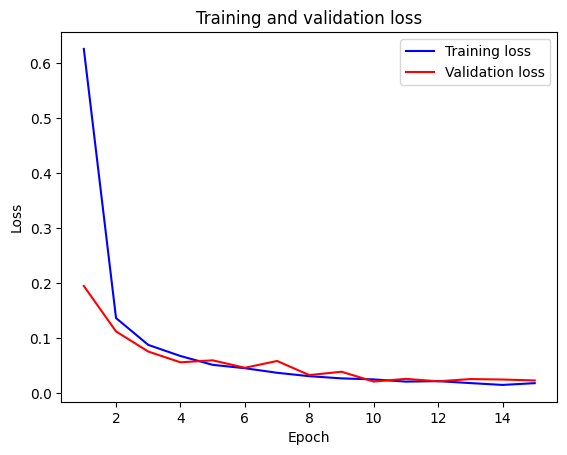

In [18]:
# Extracting training and validation accuracy and loss (model_2)
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']


loss = history.history['loss']
val_loss = history.history['val_loss']


# Calculating the number of epochs
epochs = range(1, len(accuracy) + 1)

# Plotting accuracy
plt.plot(epochs, accuracy, 'b', label='Training accuracy')
plt.plot(epochs, val_accuracy, 'r', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Plotting loss
plt.plot(epochs, loss, 'b', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Model Testing

## Model 1: Custom CNN

In [68]:
# Predict the label of the test_images
probs = model1.predict(test_generator)
pred = np.argmax(probs,axis=1)

# Map the label
labels = (train_generator.class_indices)
labels = dict((v,k) for k,v in labels.items())
pred_labels = [labels[k] for k in pred]

# # Display the result
# print(pred[:5])
# print(f'The first 5 predictions: {pred_labels[:5]}')

14/14 [==============================] - 5s 364ms/step


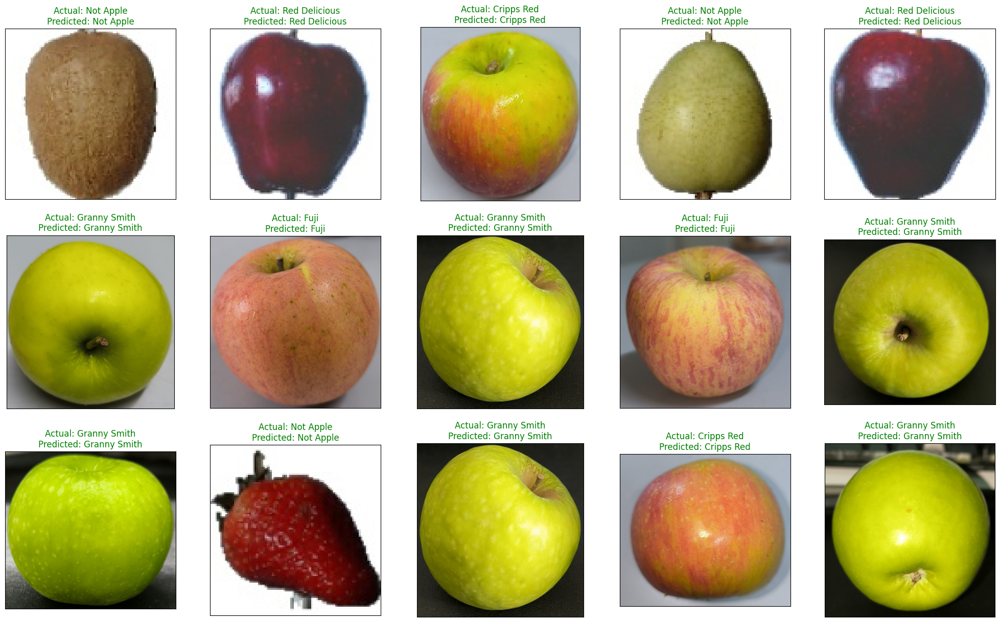

<Figure size 640x480 with 0 Axes>

In [69]:
# Display 15 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred_labels[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"Actual: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred_labels[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

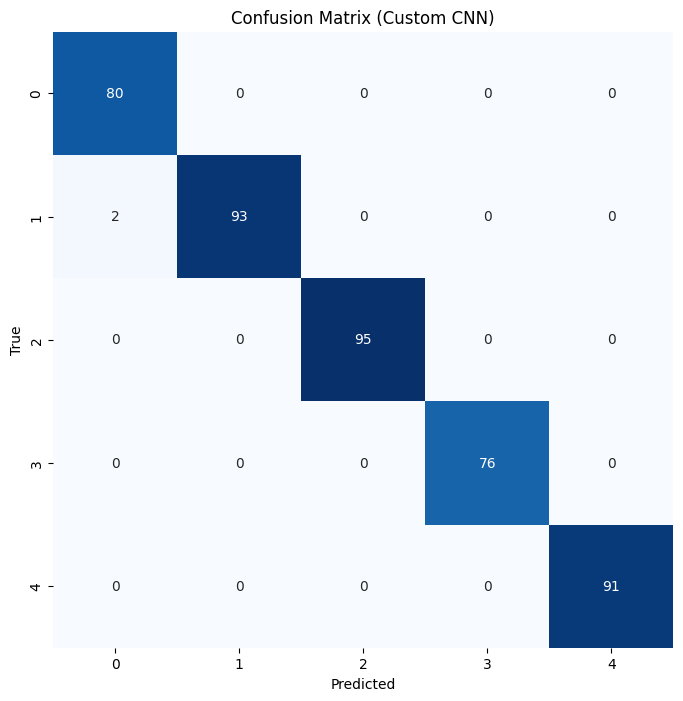

               precision    recall  f1-score   support

   Cripps Red       0.98      1.00      0.99        80
         Fuji       1.00      0.98      0.99        95
 Granny Smith       1.00      1.00      1.00        95
    Not Apple       1.00      1.00      1.00        76
Red Delicious       1.00      1.00      1.00        91

     accuracy                           1.00       437
    macro avg       1.00      1.00      1.00       437
 weighted avg       1.00      1.00      1.00       437



In [70]:
# Get true labels from the test generator
actual = test_generator.classes

# Plot confusion matrix
cm = confusion_matrix(actual, pred)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Custom CNN)')
plt.show()

# Print classification report
class_labels = list(test_generator.class_indices.keys())
print(classification_report(actual, pred, target_names=class_labels))

## Model 2: MobileNetV2

In [77]:
# Predict the label of the test_images
probs2 = model2.predict(test_generator)
pred2 = np.argmax(probs2,axis=1)

# Map the label
labels2 = (train_generator.class_indices)
labels2 = dict((v,k) for k,v in labels2.items())
pred_labels2 = [labels2[k] for k in pred2]

# # Display the result
# print(pred[:5])
# print(f'The first 5 predictions: {pred_labels[:5]}')

14/14 [==============================] - 7s 470ms/step


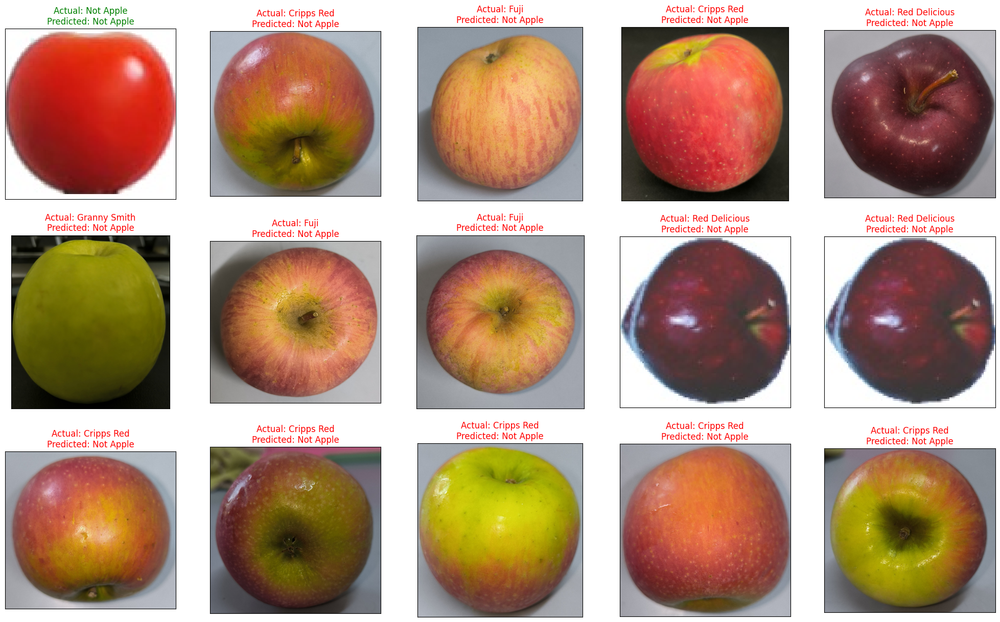

<Figure size 640x480 with 0 Axes>

In [78]:
# Display 15 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred_labels2[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"Actual: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred_labels2[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

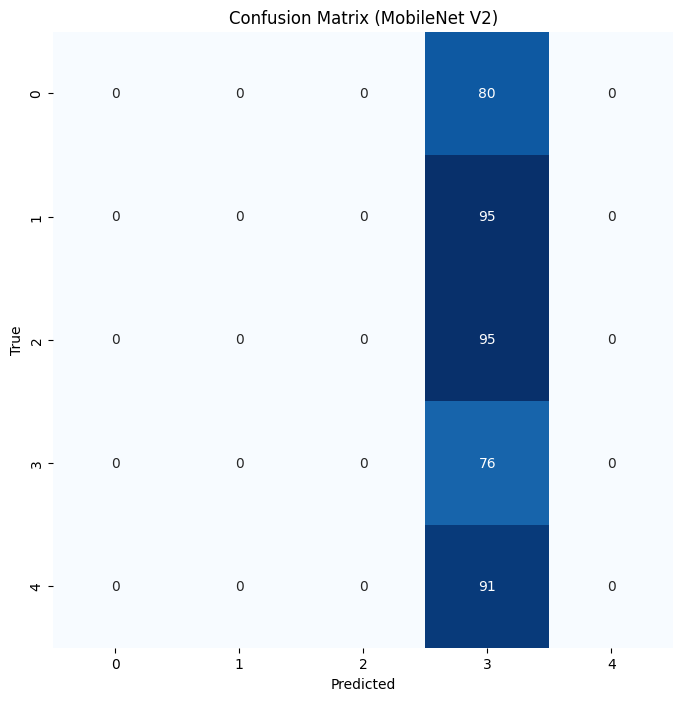

               precision    recall  f1-score   support

   Cripps Red       0.00      0.00      0.00        80
         Fuji       0.00      0.00      0.00        95
 Granny Smith       0.00      0.00      0.00        95
    Not Apple       0.17      1.00      0.30        76
Red Delicious       0.00      0.00      0.00        91

     accuracy                           0.17       437
    macro avg       0.03      0.20      0.06       437
 weighted avg       0.03      0.17      0.05       437



C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\User\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1469: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

In [79]:
# Get true labels from the test generator
actual = test_generator.classes

# Plot confusion matrix
cm = confusion_matrix(actual, pred2)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (MobileNet V2)')
plt.show()

# Print classification report
class_labels = list(test_generator.class_indices.keys())
print(classification_report(actual, pred2, target_names=class_labels))

## Model 3: Pre-trained MobileNetV2

In [16]:
# Predict the label of the test_images
probs3 = model3.predict(test_generator)
pred3 = np.argmax(probs3,axis=1)

# Map the label
labels3 = (train_generator.class_indices)
labels3 = dict((v,k) for k,v in labels3.items())
pred_labels3 = [labels3[k] for k in pred3]

14/14 [==============================] - 7s 483ms/step


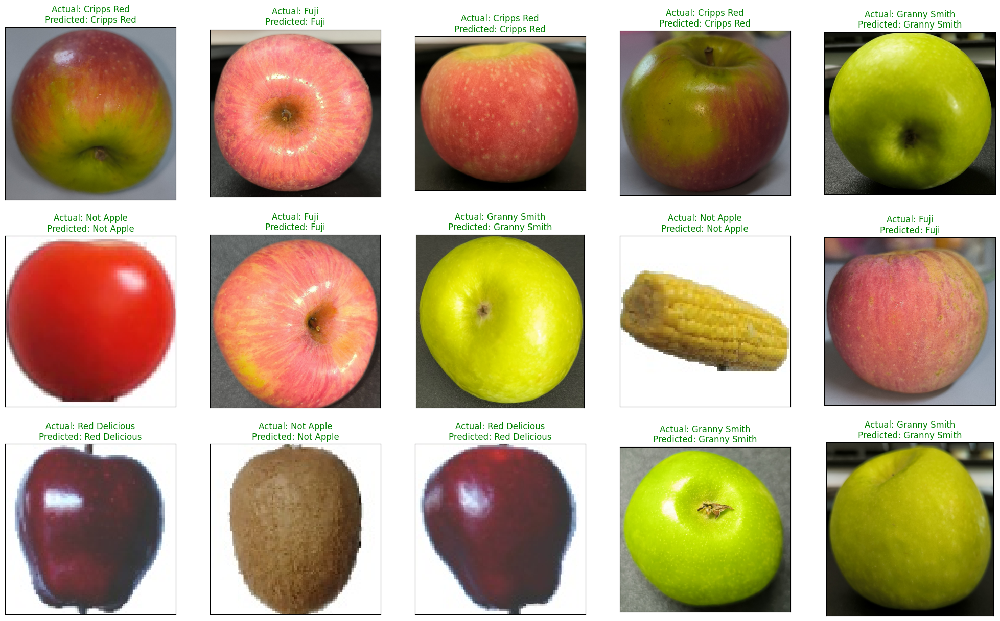

<Figure size 640x480 with 0 Axes>

In [17]:
# Display 15 random pictures from the dataset with their labels
random_index = np.random.randint(0, len(test_df) - 1, 15)
fig, axes = plt.subplots(nrows=3, ncols=5, figsize=(25, 15),
                        subplot_kw={'xticks': [], 'yticks': []})

for i, ax in enumerate(axes.flat):
    ax.imshow(plt.imread(test_df.Filepath.iloc[random_index[i]]))
    if test_df.Label.iloc[random_index[i]] == pred_labels3[random_index[i]]:
        color = "green"
    else:
        color = "red"
    ax.set_title(f"Actual: {test_df.Label.iloc[random_index[i]]}\nPredicted: {pred_labels3[random_index[i]]}", color=color)
plt.show()
plt.tight_layout()

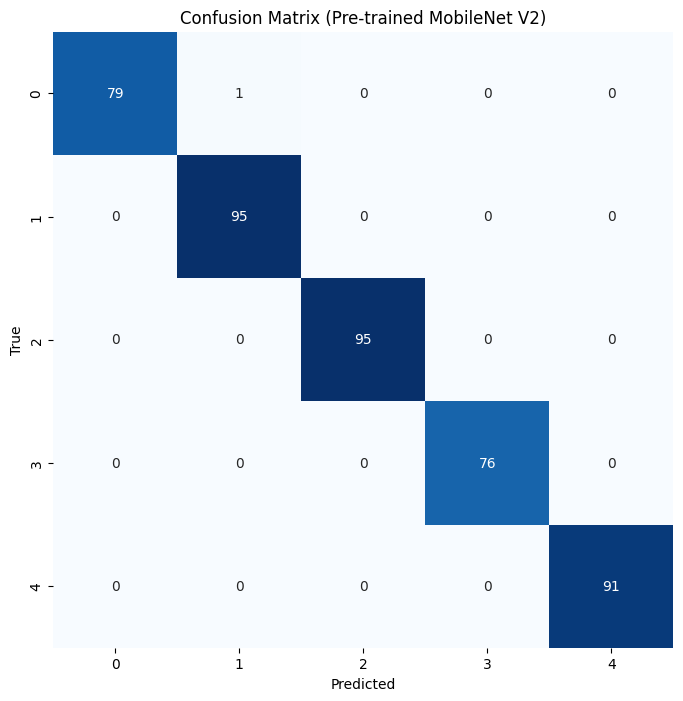

               precision    recall  f1-score   support

   Cripps Red       1.00      0.99      0.99        80
         Fuji       0.99      1.00      0.99        95
 Granny Smith       1.00      1.00      1.00        95
    Not Apple       1.00      1.00      1.00        76
Red Delicious       1.00      1.00      1.00        91

     accuracy                           1.00       437
    macro avg       1.00      1.00      1.00       437
 weighted avg       1.00      1.00      1.00       437



In [21]:
# Get true labels from the test generator
actual = test_generator.classes

# Plot confusion matrix
cm = confusion_matrix(actual, pred3)
plt.figure(figsize=(8, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix (Pre-trained MobileNet V2)')
plt.show()

# Print classification report
class_labels = list(test_generator.class_indices.keys())
print(classification_report(actual, pred3, target_names=class_labels))

## Real world testing

1/1 [==============================] - 0s 63ms/step


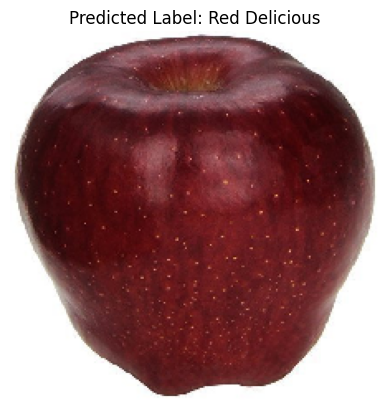

In [71]:
# Load and preprocess the image
img_path = 'testing/reddelicioustest4.jpg'
img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size as needed
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.  # Normalize pixel values

# Predict the label
probs = model1.predict(img_array)
pred_label_idx = np.argmax(probs)
pred_label = labels[pred_label_idx]

# Display the image and predicted label
plt.imshow(img)
plt.title(f'Predicted Label: {pred_label}')
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 459ms/step


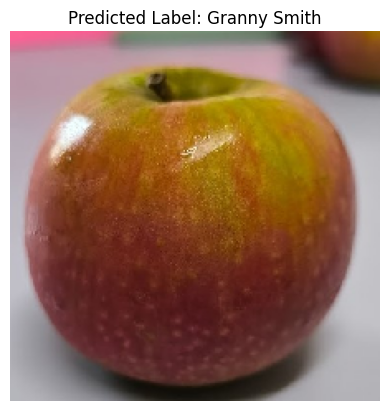

In [48]:
# Load and preprocess the image
img_path = 'testing/t3.jpg'
img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size as needed
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.  # Normalize pixel values

# Predict the label
probs = model2.predict(img_array)
pred_label_idx = np.argmax(probs)
pred_label = labels[pred_label_idx]

# Display the image and predicted label
plt.imshow(img)
plt.title(f'Predicted Label: {pred_label}')
plt.axis('off')
plt.show()

1/1 [==============================] - 0s 25ms/step


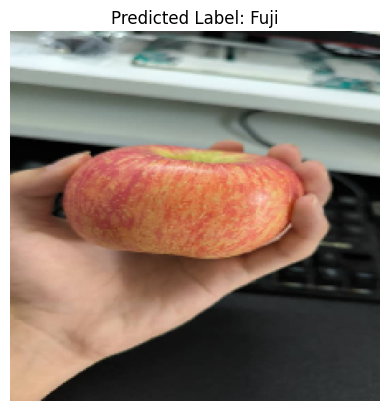

In [21]:
# Load and preprocess the image
img_path = 'testing/t2.jpg'
img = image.load_img(img_path, target_size=(224, 224))  # Adjust target_size as needed
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
img_array /= 255.  # Normalize pixel values

# Predict the label
probs = model3.predict(img_array)
pred_label_idx = np.argmax(probs)
pred_label = labels[pred_label_idx]

# Display the image and predicted label
plt.imshow(img)
plt.title(f'Predicted Label: {pred_label}')
plt.axis('off')
plt.show()